## Welcome to your notebook.


#### Run this cell to connect to your GIS and get started:

In [1]:
from arcgis.gis import GIS
gis = GIS("home")

#### Now you are ready to start!

# Assignment_2_AnastasiaWong 
## 210007301

Task 1: Create an If...Else statement that will test whether a number is divisible by three. "YOUR 
VALUE is divisible by 3" should be printed if the value is divisible by three. "YOUR VALUE is not 
divisible by three" should be printed if it is not divisible by three. Test the statement on a numeric 
variable. Upper case text in the print statement should be replaced with the tested number.


In [28]:
#create an if...else statement to test if number is divisible by three
number = 19
if number % 3 == 0:
    print("YOUR VALUE is divisible by 3")
else:
    print("YOUR VALUE is not divisible by 3")

YOUR VALUE is not divisible by 3


Task 2: Create an If...Else statement that will test whether a type of fruit, represented as a text string, 
is in a list of acceptable fruits (apple, orange, pear, kiwi, or strawberry). If the fruit is on the list, the 
following should be printed: "YOUR FRUIT is acceptable." If not, then the following should be 
printed: "YOUR FRUIT is not acceptable." Upper case text in the print statement should be replaced 
with the tested fruit

In [30]:
fruit = 'mango' 
#define list in if...else statement 
if fruit == [
    'apple', 
    'orange', 
    'pear', 
    'kiwi', 
    'strawberry', 
    'banana', 
]:
    print("YOUR FRUIT is acceptable")
else: 
    print("YOUR FRUIT is not acceptable")

YOUR FRUIT is not acceptable


Task 3: Create a function to calculate the distance between two coordinates using the haversine 
formula. Write the following formula where the input parameters are a pair of coordinates as two 
lists
The Haversine formula is the first equation to consider when calculating distances on a sphere. 
The word "Haversine" comes from the function:
haversine(θ) = sin²(θ/2)
Page | 3
The following equation where φ is latitude, λ is longitude, R is earth’s radius (mean radius = 
6,371km) is how we translate the above formula to include latitude and longitude coordinates (A 
and B are the pair of coordinates). Note that angles need to be in radians to pass to trig 
functions:
a = sin²(φB - φA/2) + cos φA * cos φB * sin²(λB - λA/2)
c = 2 * atan2( √a, √(1−a) )
d = R ⋅ c

In [33]:
#first import math module
import math 

coord1 = 51.5007, 0.1246 #Big Ben
coord2 = 56.3398, -2.7967 #St Andrews

#define function
def haversine(coord1, coord2): 
    #radius of Earth in km
    R = 6731

    #define latitude and longitude
    lat1, lon1 = coord1
    lat2, lon2 = coord2

    #convert to radians 
    lat1 = math.radians(lat1)
    lon1 = math.radians(lat1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)

    #coordinate differencing
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    #haversine equation
    a = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a)) 

    #distance in km
    distance = R * c 
    return distance 

coord1 = [51.5007, 0.1246] #Big Ben
coord2 = [56.3398, -2.7967] #St Andrews

#caculate distance 
distance = haversine(coord1, coord2)
print(f"The distance between Big Ben and St Andrews is {distance:.2f} km.")


The distance between Big Ben and St Andrews is 623.12 km.


## Part 2: Pandas and Numpy 

Question 1: How many trees are of the Quercus or Acer genus? 

In [34]:
#import modules 
import numpy as np
import pandas as pd

#read csv file 
portland_trees = pd.read_csv('/arcgis/home/portland_park_trees.csv')
print(portland_trees)

         fid  OBJECTID  Inventory_ Species   DBH Condition  TreeHeight  \
0          1       426  2017/05/09    PSME  37.4      Fair       105.0   
1          2       427  2017/05/09    PSME  32.5      Fair        94.0   
2          3       428  2017/05/09    CRLA   9.7      Fair        23.0   
3          4       429  2017/05/09    QURU  10.3      Poor        28.0   
4          5       430  2017/05/09    PSME  33.2      Fair       102.0   
...      ...       ...         ...     ...   ...       ...         ...   
25529  25530    726046  2018/08/16    QURU  31.6      Fair        74.0   
25530  25531    726443  2019/10/11    PSME   0.4      Good         8.0   
25531  25532    726444  2019/10/11    MEGL  26.3      Fair        79.0   
25532  25533    726445  2019/10/11    PCSI   8.8      Fair        43.0   
25533  25534    726446  2019/10/11    COKO   2.0      Good        18.0   

       CrownWidth  CrownWid_1 CollectedB  ...        Genus        Common_nam  \
0            44.0        57.0  

In [35]:
#Create genus subset 
genus = portland_trees[["Genus"]]
print(genus)

             Genus
0      Pseudotsuga
1      Pseudotsuga
2        Crataegus
3          Quercus
4      Pseudotsuga
...            ...
25529      Quercus
25530  Pseudotsuga
25531  Metasequoia
25532        Picea
25533       Cornus

[25534 rows x 1 columns]


In [36]:
#count number of each genus 
genus_counts = genus.value_counts() 
print(genus_counts)

Genus        
Pseudotsuga      6783
Acer             3586
Quercus          2089
Prunus           1333
Pinus             983
                 ... 
Eucommia            1
Eriobotrya          1
Daphniphyllum       1
Schima              1
Illicium            1
Name: count, Length: 117, dtype: int64


1) There are 3586 Acers and 2089 Quercus

Q2: How many trees are of the Quercus or Acer genus and have a DBH larger than 50 inches?

In [37]:
#create filtered subset for tree genus and DBH
filtered_trees = portland_trees[["DBH","Genus"]]
print(filtered_trees)

        DBH        Genus
0      37.4  Pseudotsuga
1      32.5  Pseudotsuga
2       9.7    Crataegus
3      10.3      Quercus
4      33.2  Pseudotsuga
...     ...          ...
25529  31.6      Quercus
25530   0.4  Pseudotsuga
25531  26.3  Metasequoia
25532   8.8        Picea
25533   2.0       Cornus

[25534 rows x 2 columns]


In [18]:
filtered_trees.head()

,DBH,Genus
0,37.4,Pseudotsuga
1,32.5,Pseudotsuga
2,9.7,Crataegus
3,10.3,Quercus
4,33.2,Pseudotsuga


In [39]:
#Create subset for Acer and Quercus trees that have a DBH of > 50 inches
AQ_morethan50 = filtered_trees[
    (filtered_trees["Genus"].isin(['Quercus', 'Acer'])) & 
    (filtered_trees["DBH"] > 50)
]
AQ_morethan50

,DBH,Genus
127,50.5,Acer
152,50.5,Acer
154,52.7,Acer
162,56.3,Acer
593,50.9,Acer
...,...,...
23957,59.5,Acer
24271,69.9,Quercus
24461,59.0,Quercus
25499,84.5,Acer


In [40]:
#len function to get number 
len(AQ_morethan50)

124

Q3: Which genus has the highest mean DBH of the following genera: Quercus, Acer, or Fraxinus?

In [41]:
#calculate highest mean between Acer, Quercus and Fraxinus 
highest_mean = portland_trees[portland_trees["Genus"].isin(['Quercus', 'Acer', 'Fraxinus'])].groupby("Genus")["DBH"].mean().idxmax()
print("The Genus with the highest mean between Quercus, Acer or Fraxinus:", highest_mean)

The Genus with the highest mean between Quercus, Acer or Fraxinus: Quercus


Q4: How many different species of trees are recorded in the Acer genus?

In [42]:
#acer subset from Genus 
acer = portland_trees[portland_trees["Genus"].isin(['Acer'])]
acer

,fid,OBJECTID,Inventory_,Species,DBH,Condition,TreeHeight,CrownWidth,CrownWid_1,CollectedB,...,Genus,Common_nam,Genus_spec,Functional,Size,Native,Edible,Nuisance,Origin,Species_fa
24,25,450,2017/05/15,ACGR,6.6,Fair,19.0,17.0,13.0,staff,...,Acer,paperbark maple,Acer griseum,BD,S,No,NaN,NaN,Asia - central China,Easily identified by its red-brown bark that p...
25,26,451,2017/05/15,ACGR,6.2,Fair,27.0,14.0,14.0,staff,...,Acer,paperbark maple,Acer griseum,BD,S,No,NaN,NaN,Asia - central China,Easily identified by its red-brown bark that p...
30,31,456,2017/05/15,ACPL,17.3,Fair,44.0,50.0,40.0,staff,...,Acer,Norway maple,Acer platanoides,BD,M,No,NaN,Yes,Europe - from Scandinavia and western Europe (...,Most common street tree in Portland. Pull a le...
31,32,457,2017/05/17,ACDA,6.8,Fair,20.0,23.0,13.0,staff,...,Acer,snakebark maple,Acer davidii,BD,S,No,NaN,NaN,Asia,"Leaves unlobed, but can have small basal lobes..."
41,42,467,2017/05/17,ACSA,33.5,Poor,100.0,73.0,77.0,staff,...,Acer,silver maple,Acer saccharinum,BD,L,No,NaN,NaN,"North America - eastern Canada, eastern USA fr...",The back side of the leaves is a silver gray.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25499,25500,723643,2019/10/11,ACMA,84.5,Fair,69.0,62.0,67.0,staff,...,Acer,bigleaf maple,Acer macrophyllum,BD,L,Yes,NaN,NaN,North America - Oregon and Washington west of ...,"Name comes from the large five-lobed leaves, m..."
25506,25507,724045,2019/10/11,ACMA,63.0,Poor,46.0,56.0,55.0,staff,...,Acer,bigleaf maple,Acer macrophyllum,BD,L,Yes,NaN,NaN,North America - Oregon and Washington west of ...,"Name comes from the large five-lobed leaves, m..."
25508,25509,724047,2019/10/11,ACMA,35.0,Fair,57.0,52.0,42.0,staff,...,Acer,bigleaf maple,Acer macrophyllum,BD,L,Yes,NaN,NaN,North America - Oregon and Washington west of ...,"Name comes from the large five-lobed leaves, m..."
25511,25512,724444,2019/10/11,ACMA,38.4,Fair,102.0,42.0,41.0,staff,...,Acer,bigleaf maple,Acer macrophyllum,BD,L,Yes,NaN,NaN,North America - Oregon and Washington west of ...,"Name comes from the large five-lobed leaves, m..."


In [43]:
#len to calculate number of unique species 
len(acer['Genus_spec'].unique())

20

The world_cities.csv is a file that contains cities, countries, population, coordinates (geographic) 
and a Boolean attribute that defines if the city is the capital city or not. Read this file as a Pandas 
dataframe and create the required scripts to
Q5: 
• Calculate a new column named "pop_M" (population in millions), by transforming the 
"pop" (population) column.
• Remove the original "pop" column.
• Choose/subset a city that starts with the same letter as your first name (for example, 
"Mexico City" if your first name is Michael).
• Subset the five biggest (i.e., largest population sizes) cities from the country where your 
selected city is.
• Print the result.
• Make sure you write the scripts in different code cells where you describe the process

In [44]:
#read csv file 
world_cities = pd.read_csv('/arcgis/home/world_cities.csv')
print(world_cities)

                     city       country     pop    lat    lon  capital
0      'Abasan al-Jadidah     Palestine    5629  31.31  34.34        0
1      'Abasan al-Kabirah     Palestine   18999  31.32  34.35        0
2            'Abdul Hakim      Pakistan   47788  30.55  72.11        0
3      'Abdullah-as-Salam        Kuwait   21817  29.36  47.98        0
4                   'Abud     Palestine    2456  32.03  35.07        0
...                   ...           ...     ...    ...    ...      ...
43640           az-Zubayr          Iraq  124611  30.39  47.71        0
43641            az-Zulfi  Saudi Arabia   54070  26.30  44.80        0
43642       az-Zuwaytinah         Libya   21984  30.95  20.12        0
43643        s-Gravenhage   Netherlands  479525  52.07   4.30        0
43644     s-Hertogenbosch   Netherlands  135529  51.68   5.30        0

[43645 rows x 6 columns]


In [51]:
world_cities.head()

,city,country,pop,lat,lon,capital
0,'Abasan al-Jadidah,Palestine,5629,31.31,34.34,0
1,'Abasan al-Kabirah,Palestine,18999,31.32,34.35,0
2,'Abdul Hakim,Pakistan,47788,30.55,72.11,0
3,'Abdullah-as-Salam,Kuwait,21817,29.36,47.98,0
4,'Abud,Palestine,2456,32.03,35.07,0


In [57]:
#divide pop by 1 million to get pop_M (population in millions)
pop_M = world_cities ["pop"] / 1000000
pop_M

0        0.005629
1        0.018999
2        0.047788
3        0.021817
4        0.002456
           ...   
43640    0.124611
43641    0.054070
43642    0.021984
43643    0.479525
43644    0.135529
Name: pop, Length: 43645, dtype: float64

In [59]:
#remake graph but replace 'pop' with 'pop_M'
world_cities["pop_M"] = world_cities ["pop"] / 1000000
world_cities[["city", "country", "pop_M", "lat", "lon", "capital"]].head()

,city,country,pop_M,lat,lon,capital
0,'Abasan al-Jadidah,Palestine,0.005629,31.31,34.34,0
1,'Abasan al-Kabirah,Palestine,0.018999,31.32,34.35,0
2,'Abdul Hakim,Pakistan,0.047788,30.55,72.11,0
3,'Abdullah-as-Salam,Kuwait,0.021817,29.36,47.98,0
4,'Abud,Palestine,0.002456,32.03,35.07,0


In [72]:
#select a city that start with letter 'a' - Azuma, Japan. 
#create a graph for cities in Japan
Japan_cities = world_cities[world_cities["country"].isin(['Japan'])]
Japan_cities.head()

,city,country,pop,lat,lon,capital,pop_M
188,Abashiri,Japan,42324,44.02,144.27,0,0.042324
220,Abiko,Japan,132577,35.88,140.03,0,0.132577
480,Ageo,Japan,220766,35.95,139.61,0,0.220766
513,Ago,Japan,23876,34.33,136.82,0,0.023876
570,Agui,Japan,24227,34.95,136.91,0,0.024227


In [73]:
#sort the cities in Japan in order of highest to lowest population 
Japan_largest_cities = Japan_cities.sort_values(by='pop_M', ascending=False)
Japan_largest_cities.head(5)

,city,country,pop,lat,lon,capital,pop_M
38439,Tokyo,Japan,8372440,35.67,139.77,1,8.372440
42408,Yokohama,Japan,3603710,35.47,139.62,0,3.603710
27432,Osaka,Japan,2590815,34.68,135.50,0,2.590815
25184,Nagoya,Japan,2194748,35.15,136.91,0,2.194748
33863,Sapporo,Japan,1895505,43.06,141.34,0,1.895505


The 5 biggest cities by population in Japan are Tokyo, Yokohama, Osaka, Nagoya, and Sapporo

## Part 3: Python Data Visualization
Using the same dataset portland_park_trees.csv, create using seaborn, pandas or matplotlib
libraries the following charts

In [96]:
#import the following libraries 
import seaborn as sns
import pandas as pd 
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 8] #Change the default plot size.

Graph 1: Create a scatterplot for just trees in the Ulmus genus with DBH mapped to the x-axis 
and tree height mapped to the y-axis (Hint: You will need to use the “Genus”, “DBH”, and 
“TreeHeight” attributes.).

In [97]:
#Create a subset for Ulmus genus 
Ulmus = portland_trees[portland_trees["Genus"].isin(['Ulmus'])]
Ulmus

,fid,OBJECTID,Inventory_,Species,DBH,Condition,TreeHeight,CrownWidth,CrownWid_1,CollectedB,...,Genus,Common_nam,Genus_spec,Functional,Size,Native,Edible,Nuisance,Origin,Species_fa
57,58,483,2017/05/19,ULPU,40.5,Poor,75.0,65.0,55.0,staff,...,Ulmus,Siberian elm,Ulmus pumila,BD,L,No,NaN,Yes,"Asia - eastern Siberia, Korea, northern China,...","Resistant to Dutch elm disease, and cross bred..."
58,59,484,2017/05/19,ULPU,48.5,Fair,96.0,95.0,84.0,staff,...,Ulmus,Siberian elm,Ulmus pumila,BD,L,No,NaN,Yes,"Asia - eastern Siberia, Korea, northern China,...","Resistant to Dutch elm disease, and cross bred..."
59,60,485,2017/05/19,ULPU,34.0,Fair,74.0,58.0,58.0,staff,...,Ulmus,Siberian elm,Ulmus pumila,BD,L,No,NaN,Yes,"Asia - eastern Siberia, Korea, northern China,...","Resistant to Dutch elm disease, and cross bred..."
60,61,486,2017/05/19,ULPU,35.0,Fair,60.0,57.0,53.0,staff,...,Ulmus,Siberian elm,Ulmus pumila,BD,L,No,NaN,Yes,"Asia - eastern Siberia, Korea, northern China,...","Resistant to Dutch elm disease, and cross bred..."
63,64,489,2017/05/19,ULPU,35.5,Poor,79.0,64.0,48.0,staff,...,Ulmus,Siberian elm,Ulmus pumila,BD,L,No,NaN,Yes,"Asia - eastern Siberia, Korea, northern China,...","Resistant to Dutch elm disease, and cross bred..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24765,24766,707646,2019/10/02,ULAM,7.9,Fair,21.0,22.0,15.0,staff,...,Ulmus,American elm,Ulmus americana,BD,L,No,NaN,NaN,North America - Ontario west to Alberta in Can...,"Doubly serrate margins on leaves 3"" to 6"" long..."
24767,24768,707648,2019/10/02,ULAM,3.5,Fair,18.0,18.0,18.0,staff,...,Ulmus,American elm,Ulmus americana,BD,L,No,NaN,NaN,North America - Ontario west to Alberta in Can...,"Doubly serrate margins on leaves 3"" to 6"" long..."
24768,24769,707649,2019/10/02,ULAM,3.7,Fair,30.0,18.0,13.0,staff,...,Ulmus,American elm,Ulmus americana,BD,L,No,NaN,NaN,North America - Ontario west to Alberta in Can...,"Doubly serrate margins on leaves 3"" to 6"" long..."
24776,24777,708049,2019/10/02,ULAM,3.5,Fair,17.0,16.0,18.0,staff,...,Ulmus,American elm,Ulmus americana,BD,L,No,NaN,NaN,North America - Ontario west to Alberta in Can...,"Doubly serrate margins on leaves 3"" to 6"" long..."


In [98]:
#new subset for graph categories 
Ulmus_categories = portland_trees[portland_trees["Genus"].isin(['Ulmus'])][["DBH", "TreeHeight"]]
Ulmus_categories.head()


,DBH,TreeHeight
57,40.5,75.0
58,48.5,96.0
59,34.0,74.0
60,35.0,60.0
63,35.5,79.0


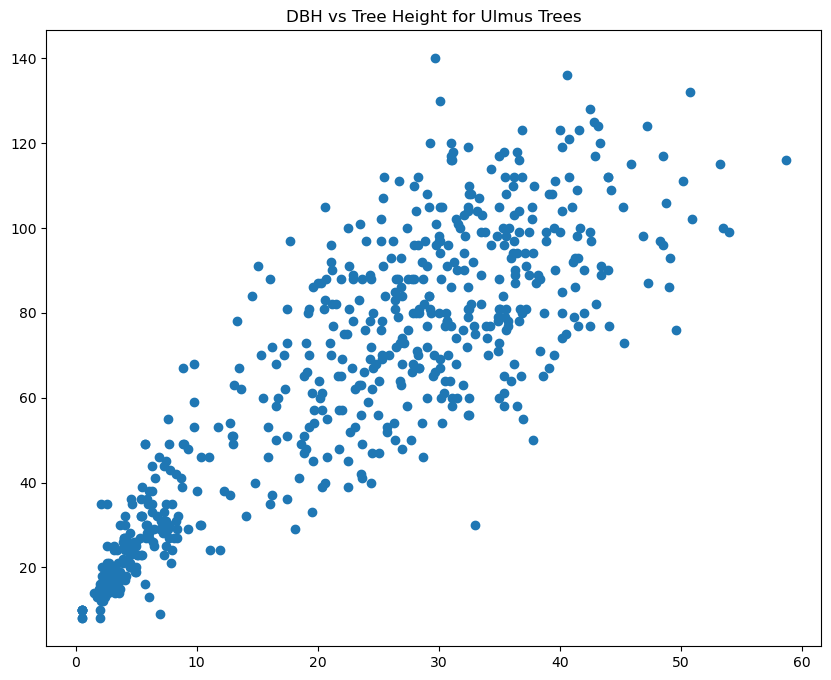

In [100]:
#create title for graph 
plt.title("DBH vs Tree Height for Ulmus Trees")
#plot scatter graph with DBH on x axis and TreeHeight on Y axis 
ulmus_scatter = plt.scatter(Ulmus.DBH, Ulmus.TreeHeight)
plt.show(ulmus_scatter)

G2: Create a scatterplot for just trees in the Ulmus genus with DBH mapped to the x-axis, tree 
height mapped to the y-axis, and tree species mapped to hue (Hint: You will need to use the 
“Genus”, “Genus_spec”, “DBH”, and “TreeHeight” attributes.)


<AxesSubplot: title={'center': 'DBH vs Tree Height for Ulmus Trees by Species'}, xlabel='DBH', ylabel='TreeHeight'>

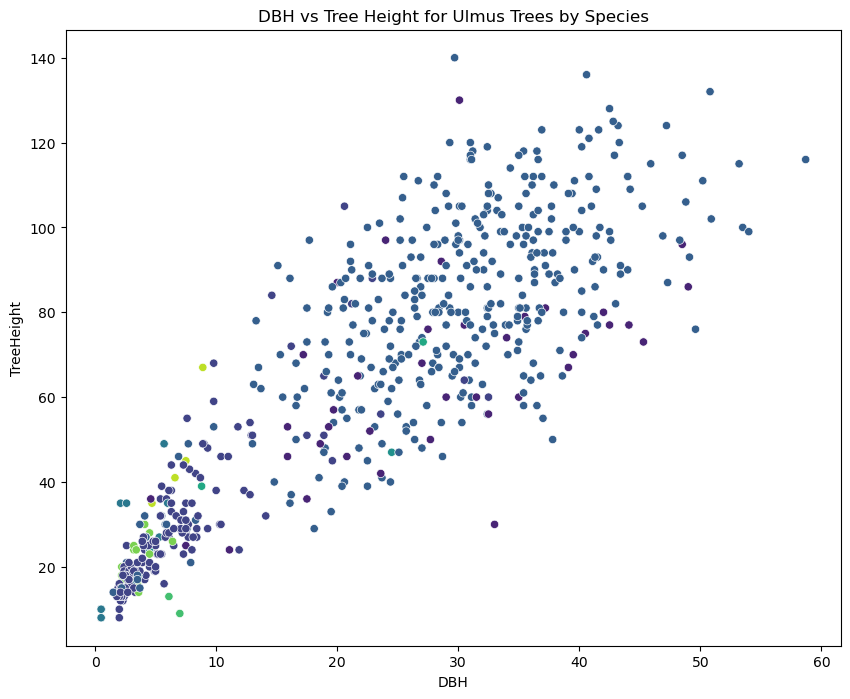

In [106]:
plt.title("DBH vs Tree Height for Ulmus Trees by Species")
sns.scatterplot(
    data=Ulmus, 
    x="DBH", 
    y="TreeHeight", 
    hue="Genus_spec",  # Map species to hue
    palette="viridis", # Choose a color palette
    legend = False
)

G3: Create a boxplot of DBH for just the Ulmus genus differentiated by species (or, each species 
should have its own boxplot)

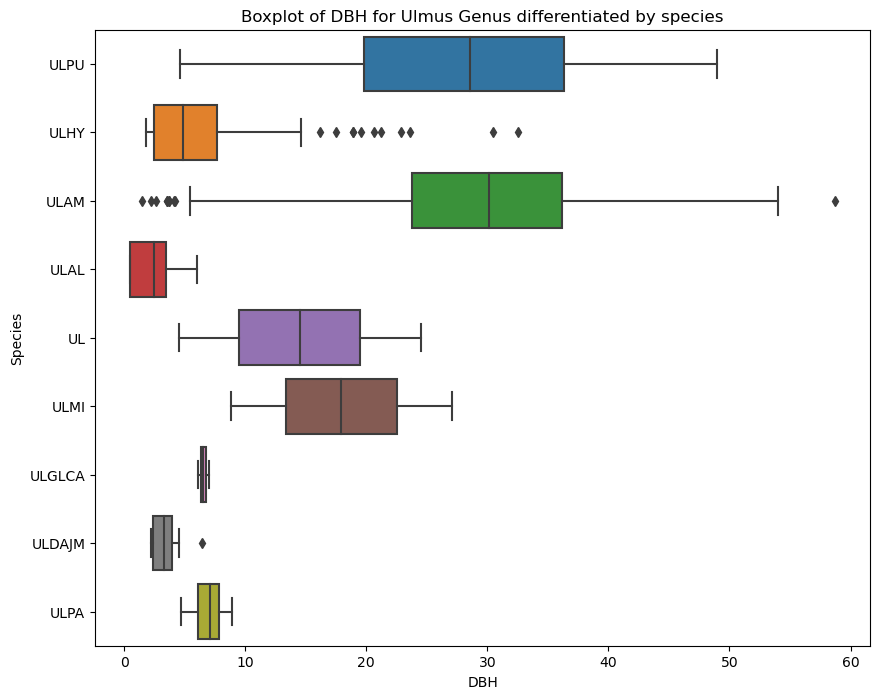

In [114]:
sns.boxplot(data=Ulmus, x='DBH', y='Species')
plt.title('Boxplot of DBH for Ulmus Genus differentiated by species')
plt.show()

G4: Combine Graphs 1 and 3 into a single figure. Do not plot a legend for any of the graphs

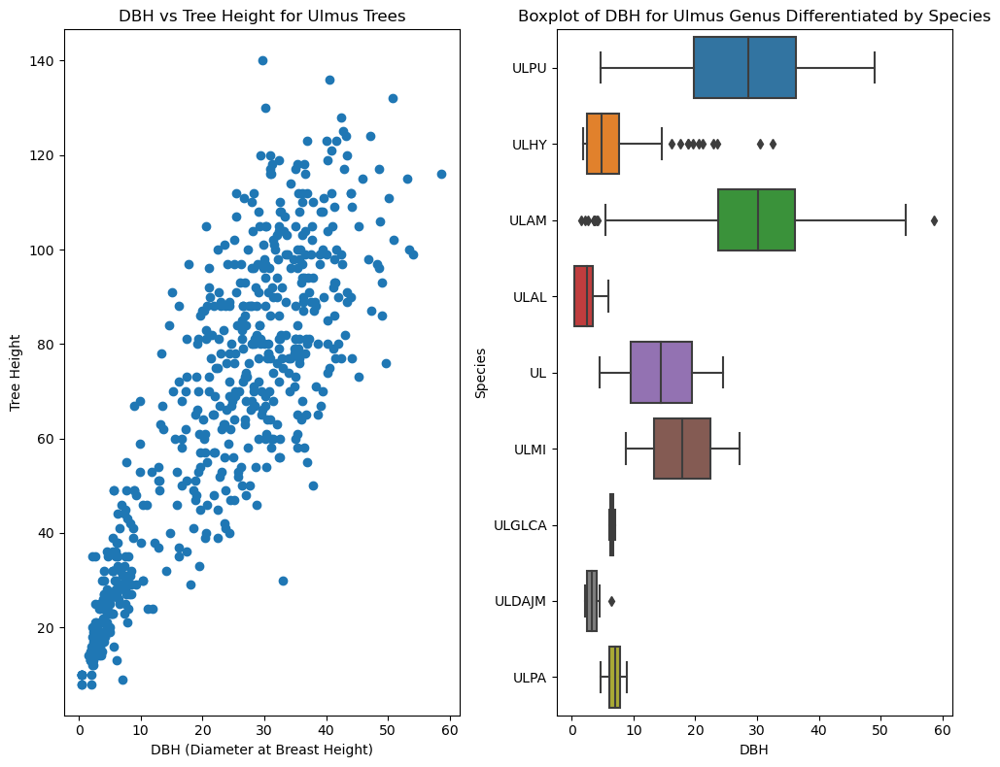

In [119]:
# Combine Graphs 1 and 3 into a single figure 
fig, axes = plt.subplots(1, 2)

# Scatter plot on the first axis (axes[0])
axes[0].scatter(Ulmus.DBH, Ulmus.TreeHeight)
axes[0].set_title("DBH vs Tree Height for Ulmus Trees")
axes[0].set_xlabel("DBH (Diameter at Breast Height)")
axes[0].set_ylabel("Tree Height")

# Boxplot on the second axis (axes[1])
sns.boxplot(data=Ulmus, x='DBH', y='Species', ax=axes[1]) 
axes[1].set_title("Boxplot of DBH for Ulmus Genus Differentiated by Species")

# Adjust the layout to make sure the plots do not overlap
plt.tight_layout()

# Show the combined figure
plt.show()


## Part 4: Python GeoPandas

Go to the Spatial Data Portal of Scotland and find any spatial data that you find interesting in a 
shapefile format (e.g. deer collisions). Download this data and produce code to complete the 
requested tasks.

In [126]:
pip install contextily

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [127]:
pip install mapclassify

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 1.0.63 requires nvidia-ml-py3, which is not installed.
Note: you may need to restart the kernel to use updated packages.


In [132]:
pip install geopandas

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 56.4 MB/s eta 0:00:00:00:01
Note: you may need to restart the kernel to use updated packages.


In [159]:
pip install fiona

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [160]:
pip install shapely

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [161]:
pip install pyproj

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [162]:
pip install rtree

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [163]:
pip install folium

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [164]:
pip install matplotlib

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import contextily as ctx
import rasterio as rio
from rasterio import plot

plt.rcParams['figure.figsize'] = [10, 8]

Task 1: Read the dataset(shapefile) you download as GeoPandas DataFrame

In [141]:
# Read the shapefile
deer_management = gpd.read_file('/arcgis/home/Deer management/DMG_SCOTLAND.shp')
deer_management

,HECTARES,ID,SUB_GROUP,DMG_NAME,DMG_CODE,FOR_DATA_S,TYPE,YEAR_OF_AS,Shape_Leng,Shape_Area,geometry
0,22017.800967,60.0,None,Moidart,MT,Yes,Upland DMG,2019,108895.355271,2.201780e+08,"MULTIPOLYGON (((1.79e+05 7.83e+05, 1.79e+05 7...."
1,149988.791626,18.0,None,West Sutherland,WS,Yes,Upland DMG,2019,450097.478191,1.499888e+09,"MULTIPOLYGON (((2.17e+05 9.51e+05, 2.17e+05 9...."
2,13417.639100,36.0,None,Birse Parish,EG,Yes,Upland DMG,2019,57162.492975,1.341764e+08,"POLYGON ((3.59e+05 7.99e+05, 3.59e+05 7.99e+05..."
3,88474.368109,31.0,None,Cairngorm/Speyside,CS,Yes,Upland DMG,2019,193661.920522,8.847437e+08,"POLYGON ((3.16e+05 8.19e+05, 3.16e+05 8.19e+05..."
4,20537.769037,23.0,None,East Ross,ER,Yes,Upland DMG,2019,69139.852192,2.053777e+08,"POLYGON ((2.59e+05 8.92e+05, 2.59e+05 8.92e+05..."
5,48592.556756,43.0,None,Morvern,MN,Yes,Upland DMG,2019,151526.167599,4.859256e+08,"POLYGON ((1.83e+05 7.61e+05, 1.83e+05 7.61e+05..."
6,35009.320630,33.0,South Ross,South Ross - Affric and Kintail,SR,Yes,Upland sub DMG,2019,144499.983671,3.500932e+08,"POLYGON ((2.31e+05 8.28e+05, 2.31e+05 8.28e+05..."
7,190896.159669,54.0,None,Harris and Lewis,HL,Yes,Upland DMG,2019,764957.620735,1.908962e+09,"POLYGON ((1.52e+05 9.67e+05, 1.52e+05 9.67e+05..."
8,42928.247639,52.0,None,Arran,AN,Yes,Upland DMG,2019,103494.927864,4.292825e+08,"POLYGON ((1.95e+05 6.52e+05, 1.95e+05 6.52e+05..."
9,44375.144931,32.0,None,Glenelg,GE,Yes,Upland DMG,2019,145066.239146,4.437514e+08,"POLYGON ((1.87e+05 8.25e+05, 1.87e+05 8.25e+05..."


T2: Use the correct code to plot the first 5 and the last 5 sets of records in your selected
dataset.

Text(0.5, 1.0, 'First 5 Sets of Records from the Dataset')

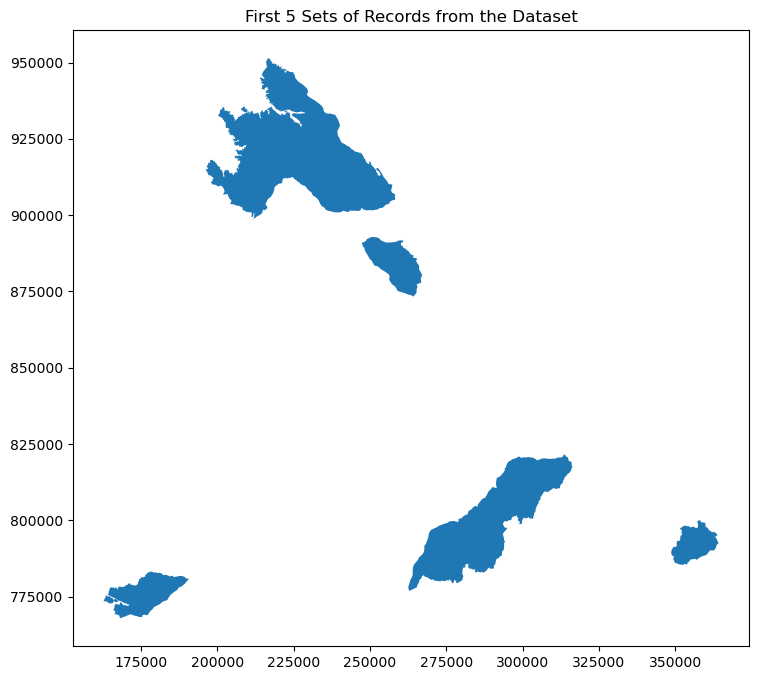

In [194]:
#plot first 5 sets of records in dataset 
first_5.plot()
plt.title("First 5 Sets of Records from the Dataset")

Text(0.5, 1.0, 'Last 5 Sets of Records from the Dataset')

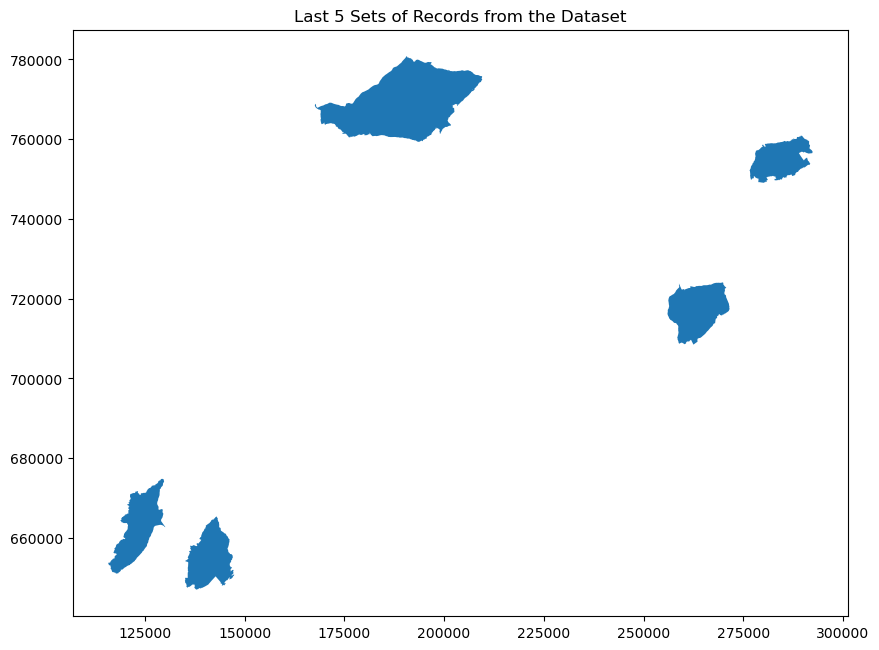

In [195]:
#plot last 5 sets of records in dataset
last_5.plot()
plt.title("Last 5 Sets of Records from the Dataset")

T3. Create a map where you can explore the selected dataset. Try to plot the map using some 
categorical attribute. Include a ToolTip

In [62]:
#explore deer management shapefile
deer_management.explore(tooltip='DMG_NAME')
#adding a Tooltip (enabled by the folium package) will allow your cursor to reveal a specific column in the dataset. I have chosen to reveal the DMG name 

T4. What is the Coordinate Reference System of the selected dataset?

In [183]:
#find the crs 
deer_management.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

T5. How many features does the selected dataset contain?

In [184]:
#use len function to determine number of features 
len(deer_management)

58

T6. Define a sub-setting filter to create a new geopandas dataframe where you filter the 
selected dataset based on a categorical attribute.

In [190]:
#create DMG name subset based on categorical attribute
DMG_filtered = deer_management[["DMG_NAME"]]
DMG_filtered

,DMG_NAME
0,Moidart
1,West Sutherland
2,Birse Parish
3,Cairngorm/Speyside
4,East Ross
5,Morvern
6,South Ross - Affric and Kintail
7,Harris and Lewis
8,Arran
9,Glenelg


T7. Define a sub-setting filter to create a new geopandas dataframe where you filter the 
selected dataset based on a numerical attribute.

In [189]:
#create subset for hectares which is a numerical attribute
hectares_filtered = deer_management[["HECTARES"]]
hectares_filtered

,HECTARES
0,22017.800967
1,149988.791626
2,13417.639100
3,88474.368109
4,20537.769037
5,48592.556756
6,35009.320630
7,190896.159669
8,42928.247639
9,44375.144931


T8. Plot the new/filtered geopandas dataframe using one of the attributes to create a 
choropleth map.

Text(0.5, 1.0, 'Choropleth map showing number of hectares for deer management')

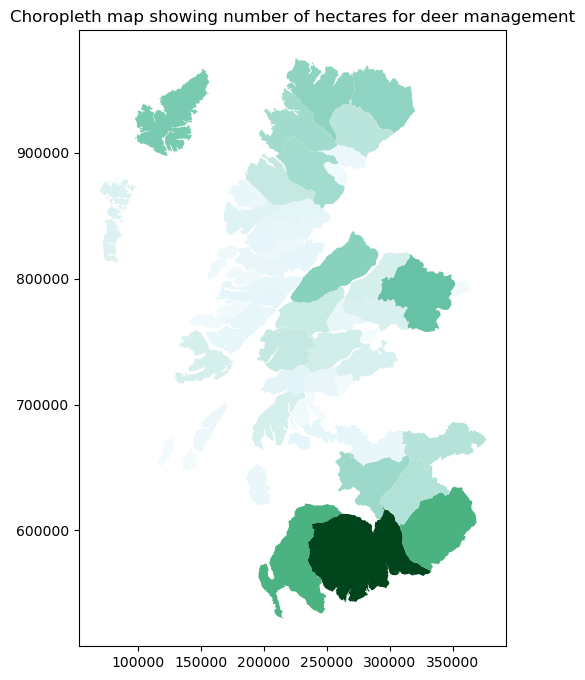

In [196]:
deer_management.plot(column="HECTARES", cmap="BuGn")
plt.title("Choropleth map showing number of hectares for deer management")

## Part 5: Python Rasterrio
The dataset for this part of the assignment is elev.tif a 30 m spatial resolution digital elevation 
model (DEM) derived from the National Elevation Dataset (NED) in Canada with elevation in 
meters.

In [198]:
pip install earthpy rasterio

DEPRECATION: Loading egg at /opt/conda/lib/python3.11/site-packages/tflite_model_maker-0.3.4-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


Task 1. Read the file as a rasterio dataset

In [219]:
# Open the .tif file and read
with rio.open('/arcgis/home/elev.tif') as dataset:
    elev = dataset.read()
    print(elev)

[[[-32768 -32768 -32768 ... -32768 -32768 -32768]
  [-32768 -32768 -32768 ... -32768 -32768 -32768]
  [-32768 -32768 -32768 ... -32768 -32768 -32768]
  ...
  [-32768 -32768 -32768 ... -32768 -32768 -32768]
  [-32768 -32768 -32768 ... -32768 -32768 -32768]
  [-32768 -32768 -32768 ... -32768 -32768 -32768]]]


T2: What is the CRS of the dataset?


In [223]:
elev = rio.open('/arcgis/home/elev.tif')
print(elev.crs)

EPSG:32617


T3: Describe the raster dataset regarding the raster extent (bounds), the reference system, and 
how many bands are in this dataset.

In [242]:
elev = rio.open('/arcgis/home/elev.tif')
print(elev.name)
print(elev.count)
print(elev.width)
print(elev.height)
print(elev.bounds)
print(elev.crs)
# elev close()

/arcgis/home/elev.tif
1
6303
5897
BoundingBox(left=479753.39945587853, bottom=4170823.2037591375, right=668843.3994558785, top=4347733.203759138)
EPSG:32617


T4: Create a plot/map of the raster dataset.

In [256]:
elev_arr = elev.read(1)
elev_arr

array([[-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       ...,
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768]], dtype=int16)

In [257]:
image_read_masked = np.ma.masked_array(elev_arr, mask=(elev_arr == 0))

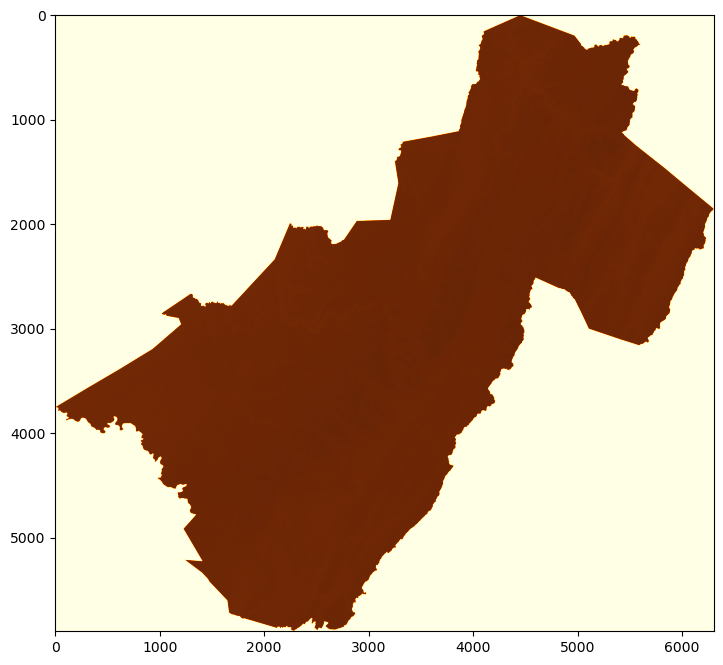

In [261]:
plt.rcParams['figure.figsize'] = [10, 8]
plt.imshow(image_read_masked, cmap="YlOrBr")

T5: Create Histograms from the raster.

In [272]:
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

(<Figure size 1200x1200 with 1 Axes>,
 <AxesSubplot: title={'center': 'Histogram from raster'}>)

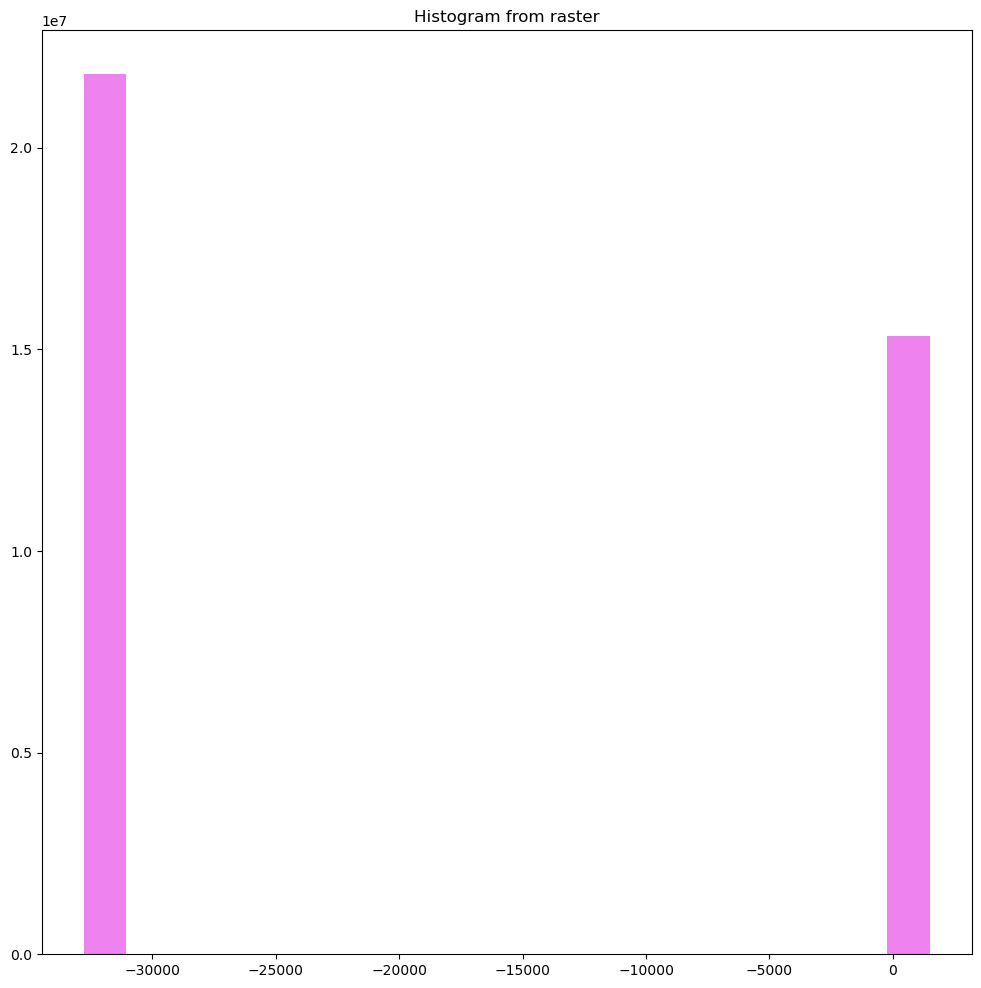

In [274]:
ep.hist(image_read_masked, colors=["violet"], title="Histogram from raster")